<a href="https://colab.research.google.com/github/Wrseno/pengolahan-ctira/blob/main/minggu_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
# import semua library
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters, feature, io
from skimage.filters.rank import gradient
from skimage.morphology import disk

# Praktikum 1
## Deteksi Tepi Menggunakan Operator Sobel

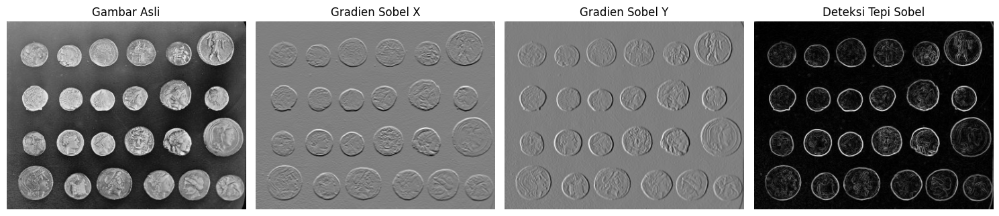

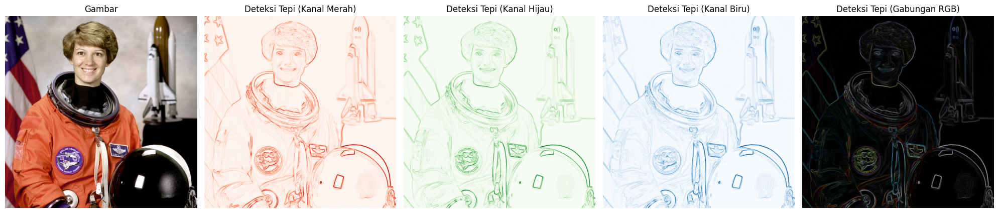

In [4]:
# Gambar coins
image_coins = data.coins()
image = data.astronaut()
gray_image = color.rgb2gray(image_coins) if image_coins.ndim == 3 else image_coins

sobel_x = filters.sobel_h(gray_image)
sobel_y = filters.sobel_v(gray_image)
sobel_edge = filters.sobel(gray_image)

fig_coins, axes_coins = plt.subplots(1, 4, figsize=(15, 5))
ax_coins = axes_coins.ravel()

ax_coins[0].imshow(gray_image, cmap="gray")
ax_coins[0].set_title("Gambar Asli")
ax_coins[0].axis("off")

ax_coins[1].imshow(sobel_x, cmap="gray")
ax_coins[1].set_title("Gradien Sobel X")
ax_coins[1].axis("off")

ax_coins[2].imshow(sobel_y, cmap="gray")
ax_coins[2].set_title("Gradien Sobel Y")
ax_coins[2].axis("off")

ax_coins[3].imshow(sobel_edge, cmap="gray")
ax_coins[3].set_title("Deteksi Tepi Sobel")
ax_coins[3].axis("off")

fig_coins.tight_layout()
plt.show()

In [ ]:
# Gambar astronaut

red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=2)

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()

ax[0].imshow(image)
ax[0].set_title("Gambar")
ax[0].axis("off")

ax[1].imshow(sobel_red, cmap="Reds")
ax[1].set_title("Deteksi Tepi (Kanal Merah)")
ax[1].axis("off")

ax[2].imshow(sobel_green, cmap="Greens")
ax[2].set_title("Deteksi Tepi (Kanal Hijau)")
ax[2].axis("off")

ax[3].imshow(sobel_blue, cmap="Blues")
ax[3].set_title("Deteksi Tepi (Kanal Biru)")
ax[3].axis("off")

ax[4].imshow(sobel_color)
ax[4].set_title("Deteksi Tepi (Gabungan RGB)")
ax[4].axis("off")

fig.tight_layout()
plt.show()

# Praktikum 2
## Deteksi Tepi Dengan Operator Roberts

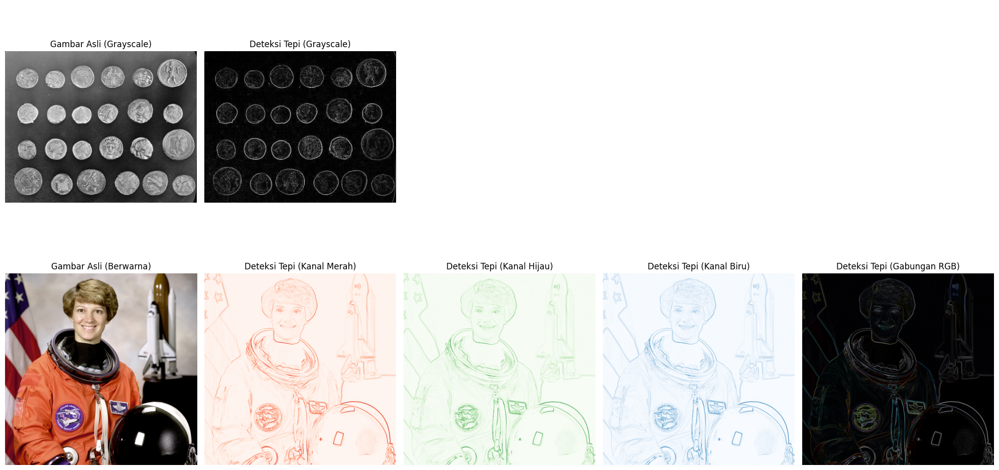

In [8]:
image_gray = data.coins()
roberts_gray = filters.roberts(image_gray)
image_color = data.astronaut();

# pisahlan kanal warna rgb
red_channel = image_color[:, :, 0]
green_channel = image_color[:, :, 1]
blue_channel = image_color[:, :, 2]

roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)

roberts_color = np.stack((roberts_red, roberts_green, roberts_blue), axis=2)

# visualisasi hasil
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
ax = axes.ravel()

# baris 1: citra grayscale
ax[0].imshow(image_gray, cmap="gray")
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(roberts_gray, cmap="gray")
ax[1].set_title("Deteksi Tepi (Grayscale)")
ax[1].axis("off")

for i in range(2, 5):
  ax[i].axis("off")

# baris 2: citra berwarna
ax[5].imshow(image_color)
ax[5].set_title("Gambar Asli (Berwarna)")
ax[5].axis("off")

ax[6].imshow(roberts_red, cmap="Reds")
ax[6].set_title("Deteksi Tepi (Kanal Merah)")
ax[6].axis("off")

ax[7].imshow(roberts_green, cmap="Greens")
ax[7].set_title("Deteksi Tepi (Kanal Hijau)")
ax[7].axis("off")

ax[8].imshow(roberts_green, cmap="Blues")
ax[8].set_title("Deteksi Tepi (Kanal Biru)")
ax[8].axis("off")

ax[9].imshow(roberts_color)
ax[9].set_title("Deteksi Tepi (Gabungan RGB)")
ax[9].axis("off")

fig.tight_layout()
plt.show()

# Praktikum 3
## Perbandingan Deteksi Tepi Dengan Beberapa Operator
### (Sobel, Roberts, Prewitt, dan Canny)

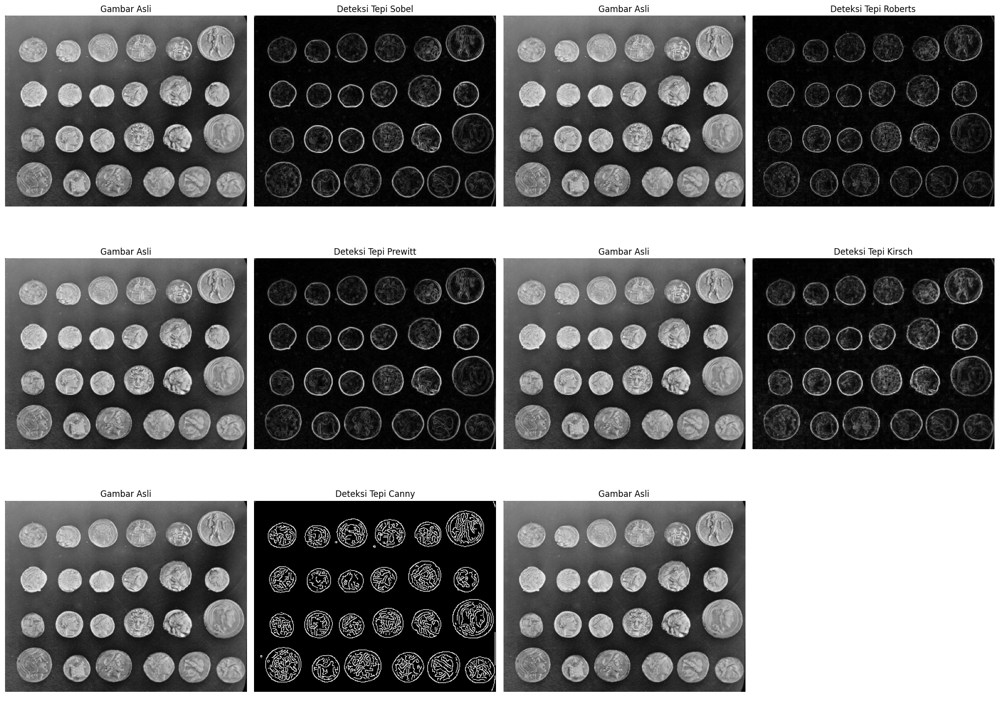

In [10]:
image_gray = data.coins()  # Gambar grayscale

sobel_edge = filters.sobel(image_gray) # Operator Sobel
roberts_edge = filters.roberts(image_gray) # Operator Roberts
prewitt_edge = filters.prewitt(image_gray) # Operator Prewitt
kirsch_edge = gradient(image_gray, disk(1))  # Operator Kirsch
canny_edge = feature.canny(image_gray, sigma=1) # Operator Canny

# visualisasi
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# Baris 1: Gambar Asli - Sobel
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel_edge, cmap='gray')
ax[1].set_title("Deteksi Tepi Sobel")
ax[1].axis("off")

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title("Gambar Asli")
ax[2].axis("off")

ax[3].imshow(roberts_edge, cmap='gray')
ax[3].set_title("Deteksi Tepi Roberts")
ax[3].axis("off")

# Baris 2: Gambar Asli - Prewitt
ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title("Gambar Asli")
ax[4].axis("off")

ax[5].imshow(prewitt_edge, cmap='gray')
ax[5].set_title("Deteksi Tepi Prewitt")
ax[5].axis("off")

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title("Gambar Asli")
ax[6].axis("off")

ax[7].imshow(kirsch_edge, cmap='gray')
ax[7].set_title("Deteksi Tepi Kirsch")
ax[7].axis("off")

# Baris 3: Gambar Asli - Canny
ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title("Gambar Asli")
ax[8].axis("off")

ax[9].imshow(canny_edge, cmap='gray')
ax[9].set_title("Deteksi Tepi Canny")
ax[9].axis("off")

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title("Gambar Asli")
ax[10].axis("off")

# Kosongkan posisi terakhir agar tampilan rapi
ax[11].axis("off")

plt.tight_layout()
plt.show()


# Praktikukm 4
## Perbandingan Deteksi Dengan Beberapa Operator
### (Sobel, Roberts, Prewitt, Kirsch, dan Canny)

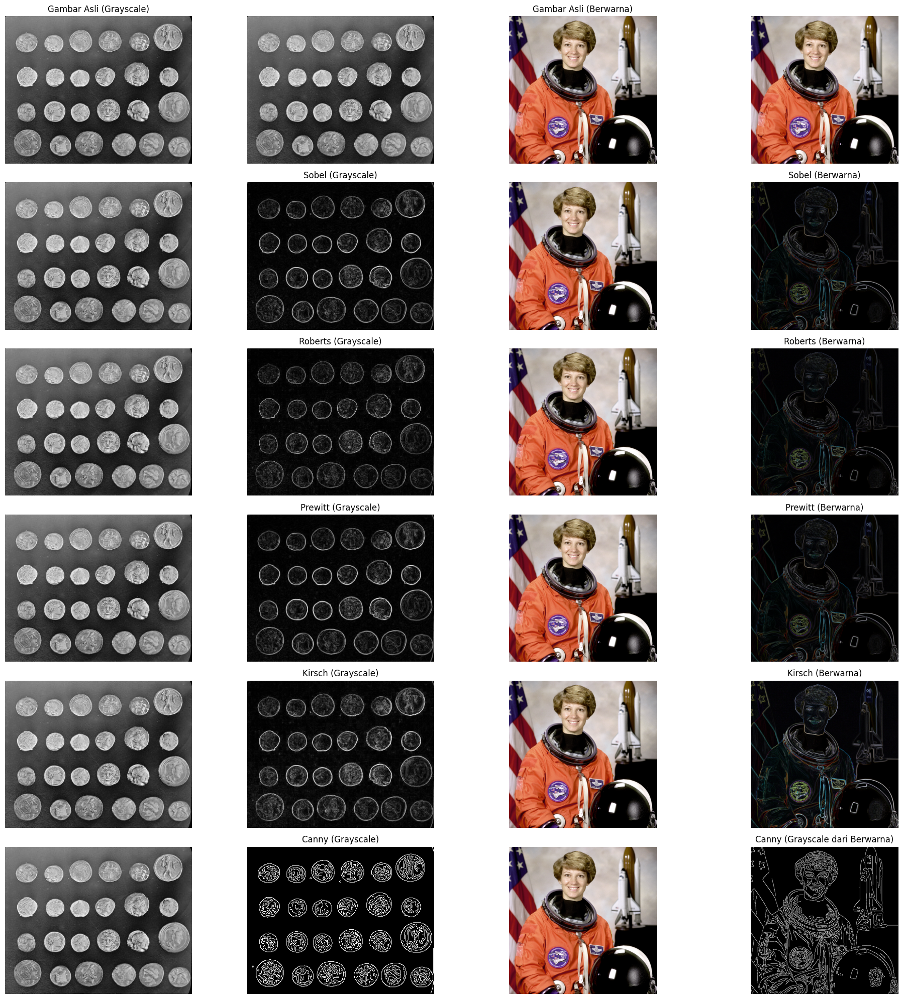

In [12]:
image_gray = data.coins()  # Gambar grayscale
image_color = data.astronaut()  # Gambar berwarna

sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

# fungsi deteksi
def apply_edge_detection(image, operator):
    """Menerapkan operator deteksi tepi pada setiap kanal warna (R, G, B)."""
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)  # Canny hanya untuk grayscale

# visualisasi
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

# ----- Baris 1: Gambar Asli -----
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(image_gray, cmap='gray')  # Placeholder
ax[1].axis("off")

ax[2].imshow(image_color)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[2].axis("off")

ax[3].imshow(image_color)  # Placeholder
ax[3].axis("off")

# ----- Baris 2: Sobel -----
ax[4].imshow(image_gray, cmap='gray')
ax[4].axis("off")

ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[5].axis("off")

ax[6].imshow(image_color)
ax[6].axis("off")

ax[7].imshow(sobel_color)
ax[7].set_title("Sobel (Berwarna)")
ax[7].axis("off")

# ----- Baris 3: Roberts -----
ax[8].imshow(image_gray, cmap='gray')
ax[8].axis("off")

ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[9].axis("off")

ax[10].imshow(image_color)
ax[10].axis("off")

ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")
ax[11].axis("off")

# ----- Baris 4: Prewitt -----
ax[12].imshow(image_gray, cmap='gray')
ax[12].axis("off")

ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[13].axis("off")

ax[14].imshow(image_color)
ax[14].axis("off")

ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")
ax[15].axis("off")

# ----- Baris 5: Kirsch -----
ax[16].imshow(image_gray, cmap='gray')
ax[16].axis("off")

ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[17].axis("off")

ax[18].imshow(image_color)
ax[18].axis("off")

ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")
ax[19].axis("off")

# ----- Baris 6: Canny -----
ax[20].imshow(image_gray, cmap='gray')
ax[20].axis("off")

ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[21].axis("off")

ax[22].imshow(image_color)
ax[22].axis("off")

ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")
ax[23].axis("off")

plt.tight_layout()
plt.show()


## Program Perbandingan Deteksi Tepi Dari Beberapa Operator
### Dengan Gambar Sendiri

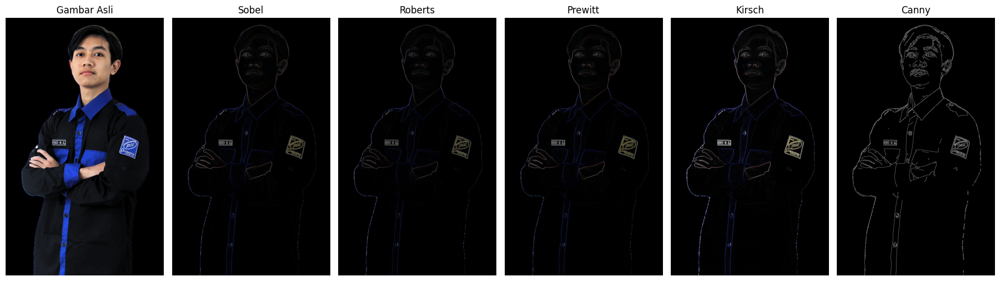

In [17]:
image = io.imread('/content/warseno.png')

# mengambil hanya 3 channel (RGB), karena gambar memiliki alpha (RGBA)
if image.shape[-1] == 4:
  image = image[:, :, :3]

# membuat fungsi untuk setiap operator
def apply_edge_detection(image, operator):
  red = operator(image[:, :, 0])
  green = operator(image[:, :, 1])
  blue = operator(image[:, :, 2])

  return np.stack((red, green, blue), axis=2)

# menyimpan data dalam dictionary
filters_dict = {
  "Gambar Asli": image,
  "Sobel": apply_edge_detection(image, filters.sobel),
  "Roberts":apply_edge_detection(image, filters.roberts),
  "Prewitt": apply_edge_detection(image, filters.prewitt),
  "Kirsch": apply_edge_detection(image, lambda img: gradient(img, disk(1))),
  "Canny": feature.canny(color.rgb2gray(image), sigma=1)
}

# membuat subplots
fig, ax = plt.subplots(1, len(filters_dict), figsize=(18, 5))

# mengulangi setiap operator dalam dictionary
for i, (title, image) in enumerate(filters_dict.items()):
  cmap = "gray" if title == "Canny" else None
  ax[i].imshow(image, cmap=cmap)
  ax[i].set_title(title)
  ax[i].axis("off")

plt.tight_layout()
plt.show()